In [1]:
import numpy as np
import pandas as pd
import scipy as sp
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
import geopandas as gpd
import matplotlib.pyplot as plt
from shapely.geometry import Point
import pyproj
from shapely.geometry import Polygon
import requests
import io
from zipfile import ZipFile, BadZipFile

## Analiza lokalizacji stacji pomiarowych
    

In [2]:
##------------------------------Zuzia---------------------------------
# Funkcja do konwersji współrzędnych na obiekty Shapely Point
def convert_to_point(row):
    lat, lon = row['Szerokość geograficzna'], row['Długość geograficzna']
    lat_deg, lat_min, lat_sec = map(float, lat.split())
    lon_deg, lon_min, lon_sec = map(float, lon.split())
    latitude = lat_deg + lat_min / 60 + lat_sec / 3600
    longitude = lon_deg + lon_min / 60 + lon_sec / 3600
    return Point(longitude, latitude)

# Czytanie wszystkich stacji pomiarowych
def all_stations():
    data = pd.read_csv('Data/kody_stacji.csv', encoding='windows-1250',delimiter=";")    
    #Zwykłe kodowanie utf-8 nie działało --> po otwarciu pliku w Excelu można sprawdzić rodzaj kodowania 
    data = data.set_index('LP.')   #ustawiam indeks 
    data['geometry'] = data.apply(convert_to_point, axis=1)

    # Tworzenie ramki GeoPandas
    data_gfd = gpd.GeoDataFrame(data, geometry='geometry')
    return data_gfd

#Granice Małopolski
def malopolska_borders():
    # Wczytaj granice Małopolski jako obiekt typu Polygon
    granice_malopolski = gpd.read_file('Data/malopolska.shp')
    polygon_epsg2180 = granice_malopolski.geometry.iloc[0]
    
    # Utwórz transformator do przekształcania współrzędnych
    transformer = pyproj.Transformer.from_crs("EPSG:2180", "EPSG:4326", always_xy=True)
    
    # Przekształć współrzędne poligonu na współrzędne geograficzne
    polygon_wgs84_coords = []
    for x, y in polygon_epsg2180.exterior.coords:
        lon, lat = transformer.transform(x, y)
        polygon_wgs84_coords.append((lon, lat))
    
    # Utwórz obiekt poligonu w formacie EPSG:4326 (współrzędne geograficzne)
    polygon_wgs84 = Polygon(polygon_wgs84_coords)
    # Utworzenie GeoDataFrame z pojedynczym wierszem zawierającym ten poligon
    granice_malopolski = gpd.GeoDataFrame({'geometry': [polygon_wgs84]})
    return granice_malopolski
    
#Szukanie stacji pomiarowych tylko w Małopolsce
def stations_in_malopolska():
    data_gfd = all_stations()
    # Znajdź punkty wewnątrz granic Małopolski
    granice_maloposki = malopolska_borders()
    punkty_wewnatrz_malopolski = gpd.sjoin(data_gfd, granice_maloposki, how="inner", predicate="within")
    return punkty_wewnatrz_malopolski



## Pobieranie danych pomiarowych z 30 lat

In [3]:
#---------------------------------------------Krzysiek -------------------------------------------------------------------
#Pobieranie danych pomiarowych z 30 lat
def download_weather_data():
    columns = ["Kod stacji", "Nazwa stacji", "Rok", "Miesiąc", "Dzień", "Suma dobowa opadów [mm]", "Status pomiaru SMDB",
               "Rodzaj opadu [S/W/ ]", "Wysokość pokrywy śnieżnej [cm]", "Status pomiaru PKSN", "Wysokość świeżospałego śniegu [cm]",
               "Status pomiaru HSS", "Gatunek śniegu  [kod]", "Status pomiaru GATS",  "Rodzaj pokrywy śnieżnej [kod]", "Status pomiaru RPSN" ]
    dane = pd.DataFrame(columns = columns)
    lata = ["1991_1995/", "1996_2000/", "2001/", "2002/", "2003/", "2004/", "2005/", "2006/", "2007/", "2008/", 
            "2009/", "2010/", "2011/", "2012/", "2013/", "2014/", "2015/", "2016/", "2017/", "2018/", "2019/",
            "2020/", "2021/", "2022/", "2023/", "2024/"]
    
    base_url = "https://danepubliczne.imgw.pl/data/dane_pomiarowo_obserwacyjne/dane_meteorologiczne/dobowe/opad/"
    
    # Iteracja przez lata
    for rok in lata:
        if "_" in rok:
            rok_start, rok_end = map(int, rok.rstrip("/").split("_"))
            url = base_url + rok + f"{rok_start}_o.zip"
            response = requests.get(url)
            #print(f"{url}")
            print(f"Response_code = {response.status_code}, Pobieranie danych dla roku = {rok}")
            # Sprawdzenie, czy żądanie się powiodło
            if response.status_code == 200:
                # Wczytanie danych z pliku ZIP do ramki danych
                try:
                    with ZipFile(io.BytesIO(response.content)) as z:
                        for file_name in z.namelist():
                            with z.open(file_name) as f:
                                # Ustawienie odpowiedniego kodowania
                                df = pd.read_csv(f, delimiter=",", header=None, names=columns, encoding="latin-1")
                                dane = pd.concat([dane, df], ignore_index=True)
                except BadZipFile:
                        print(f"Bad ZIP file for {rok}")
        else:
            print(f"Response_code = {response.status_code}, Pobieranie danych dla roku ={rok}")
            for miesiac in range(1, 13):
                # Pobieranie pliku ZIP
                url = base_url + rok + f"{rok[:-1]}_{miesiac:02d}_o.zip"
                response = requests.get(url)
                #print(f"Tu jestem 2 - response_code = {response.status_code}, rok = {rok}, miesiac = {miesiac}")
                # Sprawdzenie, czy żądanie się powiodło
                if response.status_code == 200:
                    # Wczytanie danych z pliku ZIP do ramki danych
                    try:
                        with ZipFile(io.BytesIO(response.content)) as z:
                            for file_name in z.namelist():
                                with z.open(file_name) as f:
                                    # Ustawienie odpowiedniego kodowania
                                    df = pd.read_csv(f, delimiter=",", header=None, names=columns, encoding="latin-1")
                                    dane = pd.concat([dane, df], ignore_index=True)
                    except BadZipFile:
                        print(f"Bad ZIP file for {rok}")
    return dane
#--------------------------------------------------------------------------------------------------------------------------



## Mapowanie stacji z odpowiadającymi im danymi

In [4]:

#-------------------------------------------------------------- Michał -----------------------------------

def rain_malopolska(dane_opady, punkty_wewnatrz_malopolski):
    opady_malopolska = pd.merge(dane_opady, punkty_wewnatrz_malopolski, left_on='Kod stacji', right_on='ID', how='inner')
    opady_malopolska = opady_malopolska.drop(columns=['Nazwa stacji', 'ID'])
    opady_malopolska['Data'] = pd.to_datetime(opady_malopolska['Rok'].astype(str) + '-' + opady_malopolska['Miesiąc'].astype(str) + '-' + opady_malopolska['Dzień'].astype(str), format='%Y-%m-%d')
    opady_malopolska = opady_malopolska.drop(columns=['Rok', 'Miesiąc', 'Dzień'])
    
    opady_malopolska = opady_malopolska[['Kod stacji', 'Nazwa', 'Suma dobowa opadów [mm]', 'Data', 'Szerokość geograficzna', 'Długość geograficzna', 'geometry', 'Rzeka'] + [col for col in opady_malopolska.columns if col not in ['Kod stacji', 'Nazwa', 'Suma dobowa opadów [mm]', 'Data', 'Szerokość geograficzna', 'Długość geograficzna', 'geometry', 'Rzeka']]]
    return opady_malopolska
#--------------------------------------------------------------------------


### Zakres dat dla których dostępne są dane

In [5]:

def date_range(opady_malopolska):
    result = pd.DataFrame(columns=['ID stacji', 'Nazwa', 'geometry', 'Zakres dat'])
    for station_code in opady_malopolska['Kod stacji'].unique():
        # Wybierz dane dla danego kodu stacji
        data_for_ID = opady_malopolska[opady_malopolska['Kod stacji'] == station_code]
        
        # Określ maksymalną i minimalną datę
        min_year = data_for_ID['Data'].dt.year.min()
        max_year = data_for_ID['Data'].dt.year.max()
        
        station_name = data_for_ID['Nazwa'].iloc[0]  # Pobierz nazwę stacji
        geometry = data_for_ID['geometry'].iloc[0]  # Pobierz geometrię stacji
        
        # Dodaj wiersz do wynikowej ramki danych
        result = pd.concat([result, pd.DataFrame({'ID stacji': [station_code], 'Nazwa': [station_name],
                                                   'geometry': [geometry], 'Zakres dat': [f"{min_year} - {max_year}"]})],
                            ignore_index=True)
    
    return result


## Wizualizacje

In [6]:
#------------------------------------------------ Wizualizacje --------------------------------------------
#Wizualizacja wszystkich stacji pomiarowych na mapie
def plot_all_stations(data_gfd):

    # Wczytanie granic administracyjnych Polski
    poland = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))
    poland = poland[poland.name == 'Poland']
    
    # Tworzenie mapy
    fig, ax = plt.subplots(figsize=(7, 5))
    poland.plot(ax=ax, color='lightgreen', edgecolor='black')
    data_gfd.plot(ax=ax, marker='o', color='red', markersize=1)
    plt.title('Mapa Polski ze wszystkimi stacjami')
    plt.xlabel('Długość geograficzna')
    plt.ylabel('Szerokość geograficzna')
    plt.show()
    plt.savefig("Polska_stations.png")
    
#Wizualizacja stacji pomiarowych w Małopolsce - krzyżykiem zaznaczono stacje z których otrzymano pomiary opadów
def plot_malopolska_stations(malopolska_stations,opady_malopolska):
    opady_plot = opady_malopolska[['Kod stacji','Nazwa','geometry']].drop_duplicates()
    # Tworzenie ramki GeoPandas z podanymi danymi
    opady_plot = gpd.GeoDataFrame(opady_plot, geometry='geometry')
    granice_maloposki = malopolska_borders()
    
    fig, ax = plt.subplots(figsize=(7, 5))
    # poland.plot(ax=ax, color='lightgreen', edgecolor='black')
    granice_maloposki.plot(ax=ax,color="lightblue")
    opady_plot.plot(ax=ax, marker='x', color='blue',alpha=0.3,label='Stacje, z których wykonano pomiary opadów')
    malopolska_stations.plot(ax=ax, marker='o', color='red', markersize=1)
                
    plt.legend()
    
    plt.title('Mapa Małopolski ze stacjami')
    plt.xlabel('Długość geograficzna')
    plt.ylabel('Szerokość geograficzna')
    plt.show()
    
    plt.savefig("Małopolska_stations.png")
# -------------------------------------------------------------------------------------------------------------

## Wywołanie funkcji

In [7]:
# Wszystkie stacje pomiarowe zlokalizowane w Małopolsce
malopolska_stations = stations_in_malopolska()

#--------- Krzysiek - pobranie wszystkich danych z 30 lat ----------------
all_stations_data = download_weather_data()
#---------- Michał - stacje pomiarowe w Małopolsce z pomiarami opadów
opady_malopolska = rain_malopolska(all_stations_data, malopolska_stations)
# -------------------


Response_code = 200, Pobieranie danych dla roku = 1991_1995/
Response_code = 200, Pobieranie danych dla roku = 1996_2000/
Response_code = 200, Pobieranie danych dla roku =2001/
Response_code = 200, Pobieranie danych dla roku =2002/
Response_code = 200, Pobieranie danych dla roku =2003/
Response_code = 200, Pobieranie danych dla roku =2004/
Response_code = 200, Pobieranie danych dla roku =2005/
Response_code = 200, Pobieranie danych dla roku =2006/
Response_code = 200, Pobieranie danych dla roku =2007/
Response_code = 200, Pobieranie danych dla roku =2008/
Response_code = 200, Pobieranie danych dla roku =2009/
Response_code = 200, Pobieranie danych dla roku =2010/
Response_code = 200, Pobieranie danych dla roku =2011/
Response_code = 200, Pobieranie danych dla roku =2012/
Response_code = 200, Pobieranie danych dla roku =2013/
Response_code = 200, Pobieranie danych dla roku =2014/
Response_code = 200, Pobieranie danych dla roku =2015/
Response_code = 200, Pobieranie danych dla roku =2016

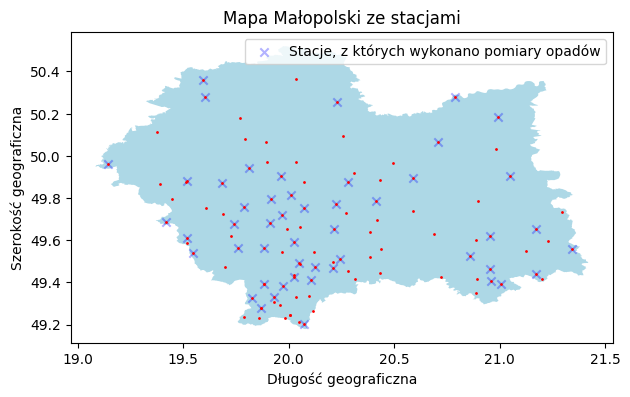

<Figure size 640x480 with 0 Axes>

In [8]:
plot_malopolska_stations(malopolska_stations,opady_malopolska)

In [9]:
opady_malopolska.head()

,Kod stacji,Nazwa,Suma dobowa opadów [mm],Data,Szerokość geograficzna,Długość geograficzna,geometry,Rzeka,Status pomiaru SMDB,Rodzaj opadu [S/W/ ],Wysokość pokrywy śnieżnej [cm],Status pomiaru PKSN,Wysokość świeżospałego śniegu [cm],Status pomiaru HSS,Gatunek śniegu [kod],Status pomiaru GATS,Rodzaj pokrywy śnieżnej [kod],Status pomiaru RPSN,Wysokość n.p.m.,index_right
0,249190010,JAWISZOWICE,0.1,1991-01-01,49 57 35,19 08 31,POINT (19.14194 49.95972),Wisła,NaN,W,0,8.0,0,8.0,NaN,8.0,NaN,8.0,244,0
1,249190010,JAWISZOWICE,2.4,1991-01-02,49 57 35,19 08 31,POINT (19.14194 49.95972),Wisła,NaN,W,0,8.0,0,8.0,NaN,8.0,NaN,8.0,244,0
2,249190010,JAWISZOWICE,4.7,1991-01-03,49 57 35,19 08 31,POINT (19.14194 49.95972),Wisła,NaN,W,0,8.0,0,8.0,NaN,8.0,NaN,8.0,244,0
3,249190010,JAWISZOWICE,2.6,1991-01-04,49 57 35,19 08 31,POINT (19.14194 49.95972),Wisła,NaN,W,0,8.0,0,8.0,NaN,8.0,NaN,8.0,244,0
4,249190010,JAWISZOWICE,0.0,1991-01-05,49 57 35,19 08 31,POINT (19.14194 49.95972),Wisła,NaN,W,0,8.0,0,8.0,NaN,8.0,NaN,8.0,244,0


In [10]:
date_range(opady_malopolska)


,ID stacji,Nazwa,geometry,Zakres dat
0,249190010,JAWISZOWICE,POINT (19.141944444444444 49.959722222222226),1991 - 2024
1,249190050,RADZISZÓW,POINT (19.81277777777778 49.942499999999995),1991 - 2015
2,249190060,SIEPRAW,POINT (19.96472222222222 49.90472222222222),1991 - 1996
3,249190080,WADOWICE,POINT (19.51861111111111 49.88194444444444),1991 - 2019
4,249190150,STRÓŻA,POINT (19.9175 49.796388888888885),1991 - 2024
5,249190170,BOGDANÓWKA,POINT (19.78805555555556 49.75944444444445),1991 - 2022
6,249190230,LUBIEŃ,POINT (19.97 49.72083333333334),1991 - 2024
7,249190240,LACHOWICE KRALE,POINT (19.41777777777778 49.68833333333333),1991 - 2015
8,249190270,OSIELEC,POINT (19.73888888888889 49.678888888888885),1991 - 2024
9,249190280,KRZECZÓW,POINT (19.91 49.683611111111105),1991 - 2022


## EDA

In [11]:
# Usuwanie duplikatów 
opady_malopolska = opady_malopolska.drop_duplicates()

#Liczenie wartości brakujących
nan_counts = opady_malopolska.isna().sum()
nan_counts


Kod stacji                                 0
Nazwa                                      0
Suma dobowa opadów [mm]                    0
Data                                       0
Szerokość geograficzna                     0
Długość geograficzna                       0
geometry                                   0
Rzeka                                   4791
Status pomiaru SMDB                   162021
Rodzaj opadu [S/W/ ]                   15017
Wysokość pokrywy śnieżnej [cm]             0
Status pomiaru PKSN                    31686
Wysokość świeżospałego śniegu [cm]         0
Status pomiaru HSS                     17317
Gatunek śniegu  [kod]                 144453
Status pomiaru GATS                    32624
Rodzaj pokrywy śnieżnej [kod]         110929
Status pomiaru RPSN                    92979
Wysokość n.p.m.                            0
index_right                                0
dtype: int64

### Boxploty

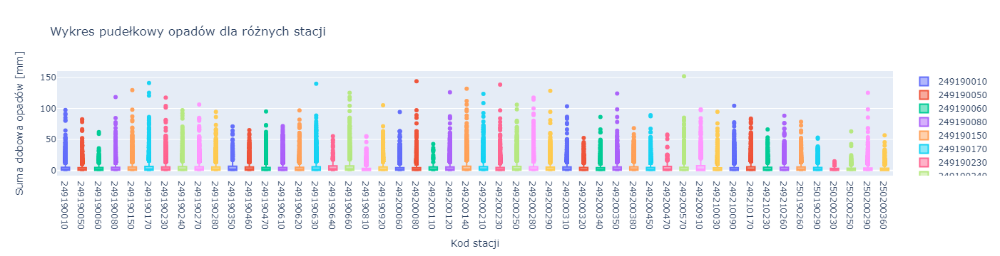

In [12]:
import plotly.graph_objs as go
import pandas as pd

# Przygotowanie danych
grouped = opady_malopolska.groupby('Kod stacji')['Suma dobowa opadów [mm]']
data = [group_data.dropna().values for group_name, group_data in grouped]

# Tworzenie interaktywnego wykresu pudełkowego
fig = go.Figure()

# Dodawanie pudełek dla każdej stacji
for i, (group_name, group_data) in enumerate(grouped):
    fig.add_trace(go.Box(y=group_data.dropna().values, name=group_name))

# Konfiguracja układu
fig.update_layout(
    title='Wykres pudełkowy opadów dla różnych stacji',
    xaxis=dict(title='Kod stacji'),
    yaxis=dict(title='Suma dobowa opadów [mm]')
)

# Wyświetlenie wykresu
fig.show()

In [13]:
opady_malopolska.describe()

,Suma dobowa opadów [mm],Status pomiaru SMDB,Status pomiaru PKSN,Status pomiaru HSS,Gatunek śniegu [kod],Status pomiaru GATS,Status pomiaru RPSN,index_right
count,177016.000000,14995.000000,145330.000000,159699.000000,32563.000000,144392.000000,84037.000000,177016.0
mean,4.528647,8.942447,8.388936,8.215318,3.575715,8.132189,8.000012,0.0
std,7.632774,0.232903,0.487510,0.411044,1.891927,0.338697,0.003450,0.0
min,0.000000,8.000000,8.000000,8.000000,0.000000,8.000000,8.000000,0.0
25%,0.300000,9.000000,8.000000,8.000000,1.000000,8.000000,8.000000,0.0
50%,1.800000,9.000000,8.000000,8.000000,4.000000,8.000000,8.000000,0.0
75%,5.400000,9.000000,9.000000,8.000000,5.000000,8.000000,8.000000,0.0
max,151.800000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,0.0


### Histogramy

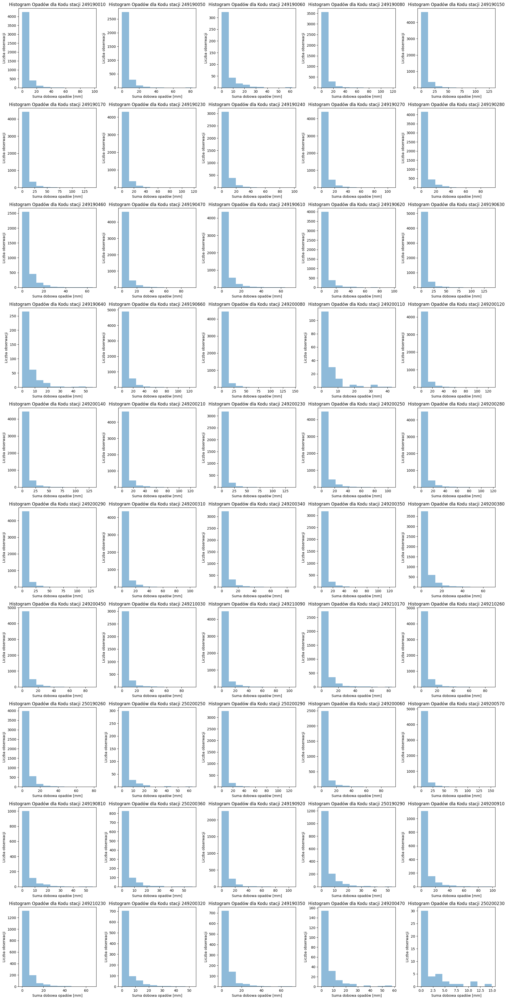

In [14]:
import matplotlib.pyplot as plt
import numpy as np

# Lista unikalnych identyfikatorów stacji
unique_station_ids = opady_malopolska['Kod stacji'].unique()

# Utwórz układ subplotów 10x5
fig, axs = plt.subplots(10, 5, figsize=(20, 40))

# Iteracja po wszystkich stacjach i wyświetlanie histogramów na odpowiednich subplotach
for i, station_id in enumerate(unique_station_ids):
    # Wybierz dane dla danego ID
    data_for_ID = opady_malopolska[opady_malopolska['Kod stacji'] == station_id]
    
    # Oblicz współrzędne subplotu dla danego indeksu
    row = i // 5
    col = i % 5
    
    # Stwórz histogram dla kolumny "Suma dobowa opadów [mm]" dla danego ID
    axs[row, col].hist(data_for_ID['Suma dobowa opadów [mm]'], bins=10, alpha=0.5)
    
    # Dodaj etykiety i tytuł dla danego subplotu
    axs[row, col].set_xlabel('Suma dobowa opadów [mm]')
    axs[row, col].set_ylabel('Liczba obserwacji')
    axs[row, col].set_title(f'Histogram Opadów dla Kodu stacji {station_id}')

# Aby uniknąć wyświetlania pustych subplotów, ukryj niepotrzebne subploty
for i in range(len(unique_station_ids), 10*5):
    row = i // 5
    col = i % 5
    fig.delaxes(axs[row, col])

# Wyświetl subploty
plt.tight_layout()
plt.show()


In [15]:
import pandas as pd

# Zainicjuj pustą listę do przechowywania danych
data_frames = []

# Pętla dla każdego unikalnego ID w kolumnie Kod stacji
for station_code in opady_malopolska['Kod stacji'].unique():
    # Wybierz dane dla danego kodu stacji
    data_for_ID = opady_malopolska[opady_malopolska['Kod stacji'] == station_code]
    
    # Określ maksymalną i minimalną datę
    min_date = data_for_ID['Data'].min()
    max_date = data_for_ID['Data'].max()
    
    # Dodaj wszystkie brakujące daty dzienne
    full_dates = pd.date_range(start=min_date, end=max_date, freq='D')
    missing_dates = full_dates[~full_dates.isin(data_for_ID['Data'])]
    
    # Utwórz ramkę danych z brakującymi datami
    missing_data = pd.DataFrame({'Data': missing_dates, 'Kod stacji': station_code, 'Suma dobowa opadów [mm]': np.nan})
    
    # Dołącz brakujące dane do oryginalnych danych
    data_for_ID = pd.concat([data_for_ID, missing_data])
    
    # Dodaj dodatkową datę na początku i na końcu
    data_for_ID = pd.concat([data_for_ID, pd.DataFrame({'Data': [min_date - pd.Timedelta(days=1), max_date + pd.Timedelta(days=1)], 
                                                        'Kod stacji': [station_code, station_code], 
                                                        'Suma dobowa opadów [mm]': [np.nan, np.nan]})], ignore_index=True)
    
    # Posortuj dane po dacie
    data_for_ID = data_for_ID.sort_values(by='Data').reset_index(drop=True)
    
    # Wypełnij brakujące wartości
    np.random.seed(69)  # Ustaw ziarno losowości dla powtarzalności
    filled_values = 3 * data_for_ID.groupby([data_for_ID['Data'].dt.year, data_for_ID['Data'].dt.day])['Suma dobowa opadów [mm]'].transform('median')
    filled_values = filled_values.sample(n=len(data_for_ID), replace=True).reset_index(drop=True)
    data_for_ID['Suma dobowa opadów [mm]'].fillna(filled_values, inplace=True)
    
    # Dodaj DataFrame do listy
    data_frames.append(data_for_ID)

# Połącz wszystkie ramki danych w jeden DataFrame
opady_malopolska_iniekcja = pd.concat(data_frames)

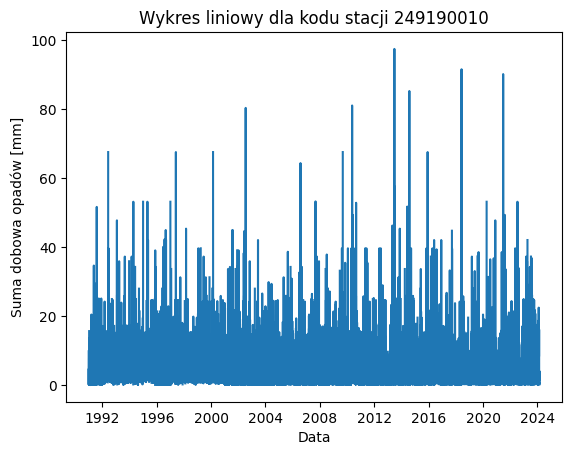

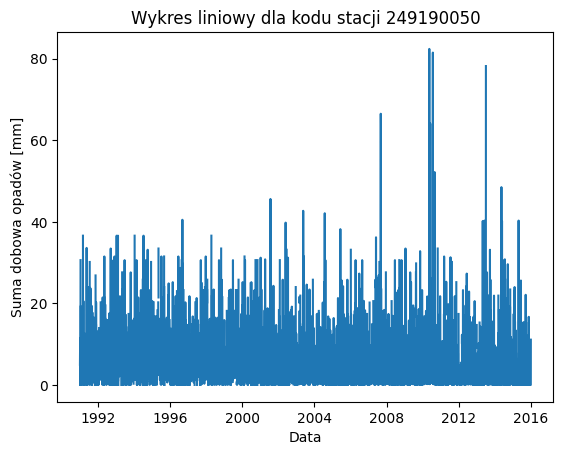

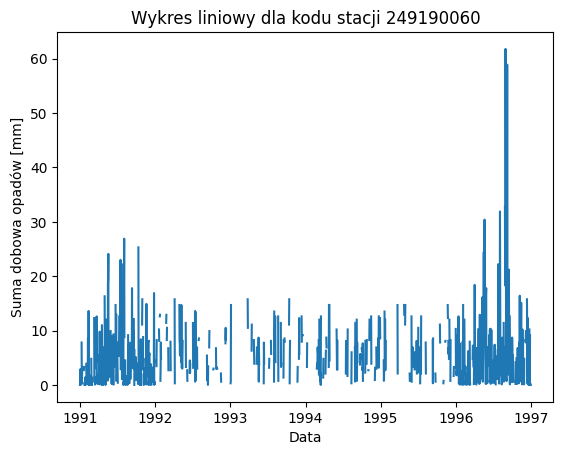

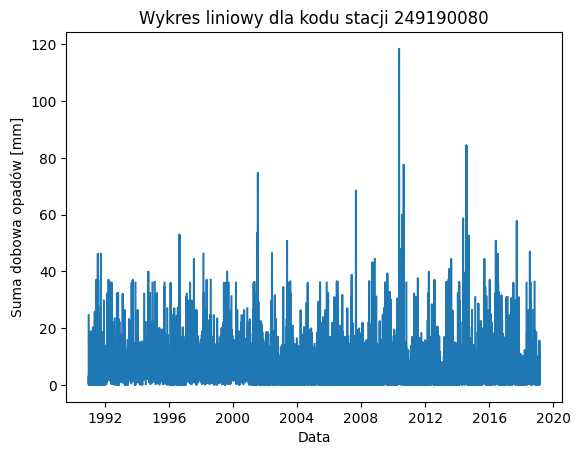

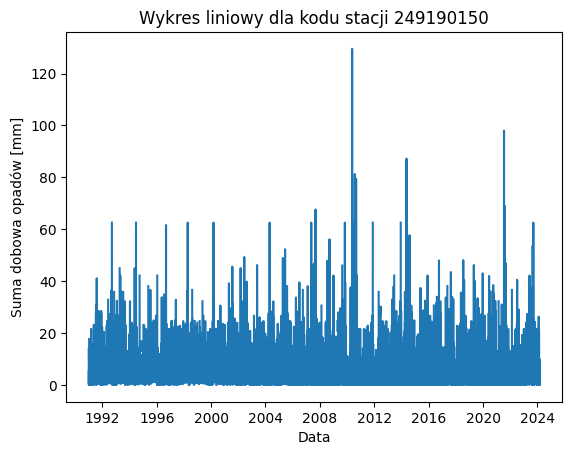

...

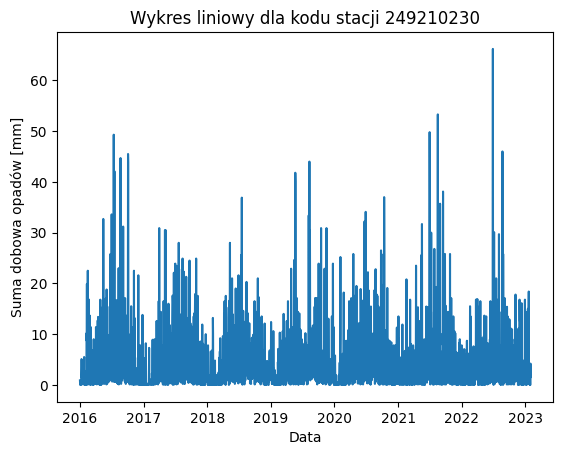

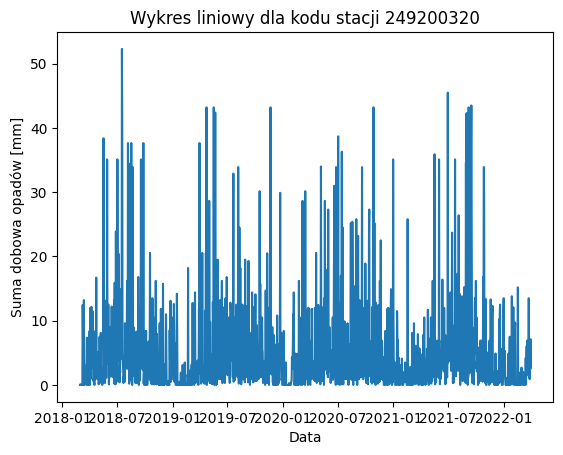

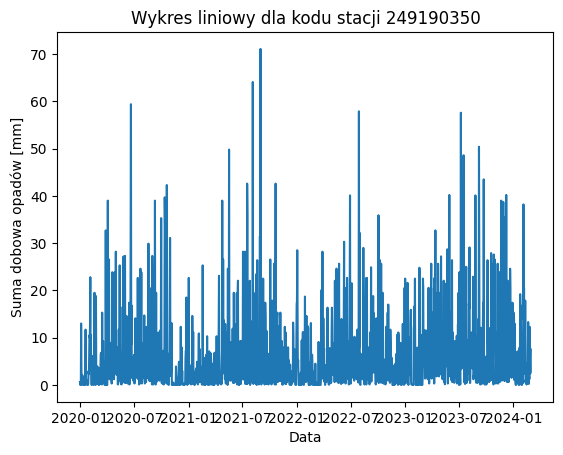

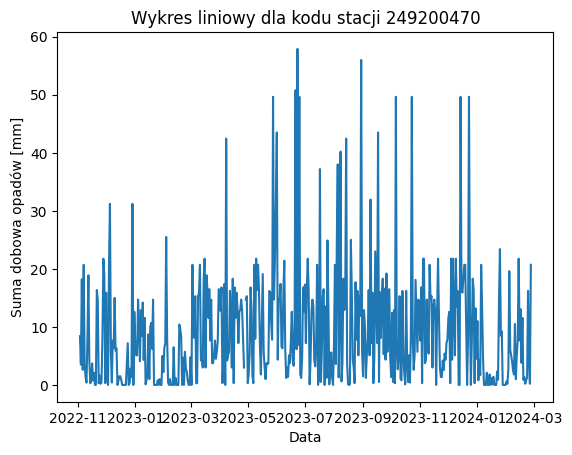

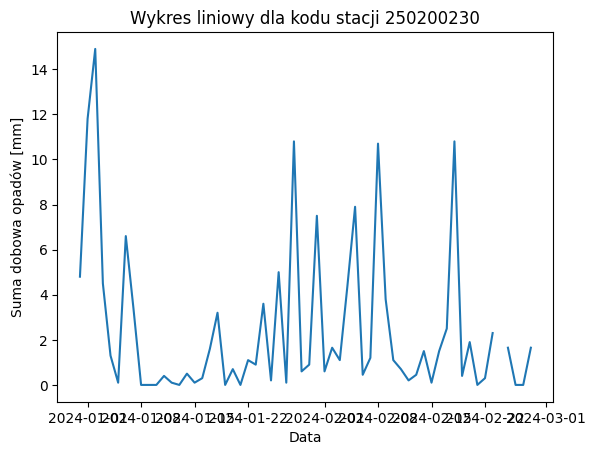

In [16]:
# Pętla dla każdego unikalnego ID w kolumnie Kod stacji
for station_code in opady_malopolska_iniekcja['Kod stacji'].unique():
    # Wybierz dane dla danego kodu stacji
    data_for_ID = opady_malopolska_iniekcja[opady_malopolska_iniekcja['Kod stacji'] == station_code]
    
    # Stwórz nowy wykres
    plt.figure()
    
    # Narysuj wykres liniowy
    plt.plot(data_for_ID['Data'], data_for_ID['Suma dobowa opadów [mm]'])
    
    # Dodaj etykiety osi
    plt.xlabel('Data')
    plt.ylabel('Suma dobowa opadów [mm]')
    
    # Dodaj tytuł
    plt.title(f'Wykres liniowy dla kodu stacji {station_code}')
    
    # Pokaż wykres
    plt.show()

